In [1]:
#Citation for the below code
'''
Title: CCMEO LiCNN Predict 
Authors: Galen Richardson, Krishan Rajaratnam, Julie Lovitt
Date: 02-25-2021
Version: 1.0
https://www.nrcan.gc.ca/science-and-data/research-centres-and-labs/canada-centre-remote-sensing/21749
'''

'\nTitle: CCMEO LiCNN Predict \nAuthors: Galen Richardson, Krishan Rajaratnam, Julie Lovitt\nDate: 02-25-2021\nVersion: 1.0\nhttps://www.nrcan.gc.ca/science-and-data/research-centres-and-labs/canada-centre-remote-sensing/21749\n'

## Lichen Prediction Script

The purpose of this script is to read a folder with lichen photos inside it and create a new folder which contains prediction results. The prediction outputs include a .csv with the file name and Lichen%'s, along with photo processing output for each photo. 

This script works by preprocessing the photo through resizing and reformatting script. Then the script completes an image super pixel segmentation, and feeds that output into the loaded neural network with weights. After an initial prediction from the neural network is created, the script calculates the Lichen% from non-border pixels and creates an output image. 

Run the cells in sequence to complete the workflow.


In [2]:
import numpy as np 
import os, shutil, time, csv

from tensorflow import keras
import tensorflow as tf
from tensorflow.keras.preprocessing import image as kimg

from PIL import Image,ImageOps
import cv2
import tifffile as TIF

#for dislaying results
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
plt.rcParams['figure.dpi'] = 150 
%matplotlib inline

## Assigning Variables

The below cell is where you input the workflow variables. Ensure that each filepath string is a raw string (put r infront of it).

In [3]:
Model_Weights = r'C:\Users\gamr0\01_TF Testing\TF_Iterations\lichen_all_v2.h5'
#The path to the model weights (.h5 file)

input_photo_dir = r'C:\Users\gamr0\01_TF Testing\data\test'
#The path to the folder which contains the photos you would like processed.

output_dir = r'C:\Users\gamr0\Desktop\lichen_all_test_res'
#The path where you would like a new folder created containing outputs.
#The last part of the path (after the last \) is where you define the output folder name
#I would set the last part of the path to "Predicted_output"
#if save == True, a folder will be made at the path that you input above.

save = True
#if save == True, then output information (figures, images) will be saved.
#if save doesn't == True, no output information will be saved.

## Pre-Processing and Setup

The below functions are used to preprocess the photos before feeding them into the neural network. 
- dir_setup is used to set up the directory and file lists. Please note the filetype variable, which lists the types of acceptable photo filetypes. 
- refig_image is used to effectively read the image and convert it into a standard image format for processing
- hsv_quick is used to resize the photos so it can be processed in the neural network. Then, using the Quick Shift algorithm the image is super-pixel segmented to increase the interpretability. A saturation image is also created, which is used for correction near the end of the workflow


In [4]:
def dir_setup(directory,pred_dir):
    filetype = ['.jpg','.JPG','.jpeg','.JPEG','.png','.PNG','.tif','.TIF','.tiff','.TIFF'] 
    #types of acceptable photos
    #creating a list of images with extentions
    global ogim_list
    ogim_list=[]
    global pred_list
    pred_list =[]
    #creating a list of just the file names
    global file_list
    file_list =[]
    if save == True:
        if os.path.exists(pred_dir):
            shutil.rmtree(pred_dir)
            os.makedirs(pred_dir)
        else:
            os.makedirs(pred_dir)
    for path,subdir,files in os.walk(directory):
        for file in files:
            file_list.append(file)
            for type in filetype:
                if type in str(file):
                    if str(file[-4:]).lower() == "tiff":
                        file_s = file[:-5]+'_p.jpg'
                        ogim_list.append(path+'\\'+file)
                        #appending same file name for TF
                        pred_list.append(pred_dir+'\\'+file_s)
                    if str(file[-4:]).lower() == "jpeg":
                        file_s = file[:-5]+'_p.jpg'
                        ogim_list.append(path+'\\'+file)
                        #appending same file name for TF
                        pred_list.append(pred_dir+'\\'+file_s)  
                    else:
                        file_s = file[:-4]+'_p.jpg'
                        ogim_list.append(path+'\\'+file)
                        #appending same file name for TF, if want to be different ending set last var to file_s
                        pred_list.append(pred_dir+'\\'+file_s)
    print('Directory setup complete \n')

In [5]:
def refig_img(input_image,savespath):
    #function used for manipulating and reading different images
    #str manipulation of last 3 letters in input image (tif or non tif)
    if input_image[-3:]=='tif':
        img = TIF.imread(input_image)
        img= Image.fromarray(img.astype('uint8'), 'RGB')
        imgb=img.copy()
    #if photo isnt a tif, use PIL to open the file
    else:
        img = Image.open(input_image)   
        imgb = img.copy()
    #RGB messes up everything, this converts all RGBA files to RGB
    if img.mode == 'RGBA':
        open_cv_image = np.array(img, dtype='float32')
        img = cv2.cvtColor(open_cv_image, cv2.COLOR_RGBA2RGB)
        img = Image.fromarray(img.astype('uint8'), 'RGB')
        imgb=img.copy()
    global WORKING_IMG
    WORKING_IMG = imgb

In [6]:
def resize_border():
#Resizes, creates saturation image, creates superpixel LICNN input image
    global WORKING_IMG
    global OG_IMG

    img = WORKING_IMG
    IMG_W = 800
    IMG_H= 800
    border = np.array(img)
    rescaled = (255.0 / border.max() * (border - border.min())).astype(np.uint8)
    border_r=cv2.copyMakeBorder(rescaled,2,2,2,2,cv2.BORDER_CONSTANT,value=[0,0,0])
    img = Image.fromarray(border_r)
    #resize notes
    if (img.size[0]/ img.size[1]) >1.2:
        IMG_W = 960
        IMG_H= 800
    if (img.size[0]/ img.size[1]) >1.3:
        IMG_W = 1040
        IMG_H= 800
    if (img.size[0]/ img.size[1]) >1.6:
        IMG_W = 1280
        IMG_H= 720
    if (img.size[1]/ img.size[0]) >1.2:
        IMG_W = 800
        IMG_H= 960
    if (img.size[1]/ img.size[0]) >1.3:
        IMG_W = 800
        IMG_H= 1040
    if (img.size[1]/ img.size[0]) >1.6:
        IMG_W = 720
        IMG_H= 1280
    imgf= img.resize((IMG_W,IMG_H), Image.ANTIALIAS)
    WORKING_IMG = imgf
    OG_IMG=imgf

    print (str(IMG_W)+'x'+str(IMG_H)+" Resized image")

    img_test = np.array(WORKING_IMG)
    rescaled = (255.0 / img_test.max() * (img_test - img_test.min())).astype(np.uint8)
    WORKING_IMG=rescaled

## Tensor Flow Model

The Tensorflow model is a slightly modified U-Net CNN. Run the below cells to load the Neural Network, the workflow uses tf_predict to use the model to predict the lichen in the image. 

In [7]:
from tensorflow.keras import backend as K
from tensorflow.keras import models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input,UpSampling2D, Conv2D 
from tensorflow.keras.layers import concatenate,Dropout, MaxPooling2D, Conv2DTranspose
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

#Defining the loss function
def dice_coef(y_true, y_pred, smooth=1e-6):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    dice = K.mean((2. * intersection + smooth)/(union + smooth), axis=0)
    return dice
def ModifiedDiceLoss(y_true, y_pred, smooth=1e-6, modification = 1):
    cce = tf.losses.CategoricalCrossentropy()
    return 1 - dice_coef(y_true, y_pred) + modification * cce(y_true, y_pred)
def iou_coef(y_true, y_pred, smooth=1e-6):
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
    union = K.sum(y_true,[1,2,3])+K.sum(y_pred,[1,2,3])-intersection
    iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
    return iou

#Loading the LICNN Model
def U_model():
    OUTPUT_CHANNELS = 3
    in1 = Input(shape=(None, None, 3 ))
    #changing all dropouts from .2 to .3
    conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(in1)
    conv1 = Dropout(0.3)(conv1)
    conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool1)
    conv2 = Dropout(0.3)(conv2)
    conv2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)

    conv3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool2)
    conv3 = Dropout(0.3)(conv3)
    conv3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)

    conv4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool3)
    conv4 = Dropout(0.3)(conv4)
    conv4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv4)

    up1 = concatenate([UpSampling2D((2, 2))(conv4), conv3], axis=-1)
    conv5 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(up1)
    conv5 = Dropout(0.3)(conv5)
    conv5 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv5)
    
    up2 = concatenate([UpSampling2D((2, 2))(conv5), conv2], axis=-1)
    conv6 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(up2)
    conv6 = Dropout(0.3)(conv6)
    conv6 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv6)

    up2 = concatenate([UpSampling2D((2, 2))(conv6), conv1], axis=-1)
    conv7 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(up2)
    conv7 = Dropout(0.3)(conv7)
    conv7 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv7)
    segmentation = Conv2D(3, (1, 1), activation='sigmoid', name='seg')(conv7)
    
    model = Model(inputs=[in1], outputs=[segmentation])
    '''Loss function Issues'''
    losses = {'seg': ModifiedDiceLoss}
    metrics = {'seg': ['acc']}
    #compile the model to create it
    model.compile(optimizer="adam", loss = losses, metrics=['acc', dice_coef, iou_coef])
    return model
with tf.device("/cpu:0"):
    model = U_model()
    model.load_weights(Model_Weights)

In [8]:
def tf_predict():
#prediciton script which uses the superpixel segmented image as input
    global WORKING_IMG
    im = np.expand_dims(WORKING_IMG, axis=0)
    arg = tf.convert_to_tensor(im, dtype=tf.uint8)
    arg = tf.cast(arg, tf.float32) / 255.0
    with tf.device("/cpu:0"):
        pred_mask = model.predict(arg)
        pred_mask = tf.argmax(pred_mask, axis=-1)#which ever class the output data is most similar to, it gets assigned that
        pred_mask = tf.expand_dims(pred_mask, axis=-1)
    pred_mask= np.squeeze(pred_mask)
    pred_mask=pred_mask.astype(int)
    WORKING_IMG=pred_mask

In [9]:
#simple rounding function
def myround(x, base=5):
    return base * round(x/base)

## Post-TF Manipulation

The post_tf_prep function calculates the % lichen values and creates the output images. The csv_info funciton is used to add the output information from each image (Lichen %) into a .csv file.

In [10]:
def post_tf_prep(save_loc):
#counts pixels and formats the output images
    global OG_IMG
    global WORKING_IMG
    m=WORKING_IMG.copy()
    #Counting pixels and calculating % Lichen
    count = cv2.countNonZero(m)
    print("\nNon border pixels = " + str(count))
    L_count = m.copy()
    L_count[L_count == 2]=0
    countl = cv2.countNonZero(L_count)
    global L_cor_per
    L_cor_per= float(countl/count*100)
    L_cor_per=myround(int(L_cor_per))
    print("Lichen pixels = " + str(countl))
    print("Lichen percentage = "+str(L_cor_per))
    
    #creating image which just shows corrected lichen output
    mask_cor=m.copy()
    mask_cor[mask_cor ==2]=0
    mask_cor[mask_cor !=0]=1
    mask2=Image.fromarray(mask_cor*255).convert('RGB')   
    img_M = np.array(OG_IMG).astype(np.uint8)
    disp2 = cv2.bitwise_and(img_M, (np.array(mask2).astype(np.uint8)))
    
    Trans_pil = mask2.copy()
    pixels = Trans_pil.load()
    for i in range(Trans_pil.size[0]): # for every pixel:
        for j in range(Trans_pil.size[1]):
            if (pixels[i,j])>(0,0,0):
                y=list(pixels[i,j])
                #defining purple color to represent lichen in the LICNN Highlight Image
                y=(255,75,255)
                pixels[i,j]=y
    background = np.array(OG_IMG).astype(np.uint8)
    overlay = np.array(Trans_pil).astype(np.uint8)

    ignore_color=[0,0,0]
    ignore_color = np.asarray(ignore_color)
    mask = ~(overlay==ignore_color).all(-1)
    out = background.copy()
    out[mask] = background[mask] * 0.7 + overlay[mask] * 0.3
    
    #display figure and save
    plt.figure()
    fig, ax = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)
    fig.suptitle("Lichen Percentage = "+str(L_cor_per), fontsize=16)
    ax[0,0].imshow(OG_IMG);
    ax[0,0].set_title("Input Image")
    ax[0,1].imshow(disp2)
    ax[0,1].set_title("LICNN Mask")
    ax[1,0].imshow(out)
    ax[1,0].set_title("LICNN Highlight")
    ax[1,1].imshow(m)
    ax[1,1].set_title("LICNN Output")

    for a in ax.ravel():
        a.set_axis_off()
    plt.tight_layout()
    if save==True:
        plt.savefig(save_loc,dpi=150)
    plt.show()

In [11]:
def csv_info(file):
    #used to create the CSV rows of invormation
    global L_cor_per
    global T_per
    with open(output_dir+'\Processing_Results.csv','a',newline='')as csvfile:
        writer = csv.writer(csvfile, delimiter=',',
                        quotechar='|', quoting=csv.QUOTE_MINIMAL)
        #FORMAT TO 1 DEC POINT
        writer.writerow([file,str(L_cor_per)])

## Run the Workflow

The below 2 cells defines and runs the workflow. Once the workflow begins, the outputs will display in this notebook below the run_workflow function call. 

In [12]:
def run_workflow(directory,pred_dir):
    #This function is used to run the other functions in the correct order
    start = time.time()
    dir_setup(directory,pred_dir)
    if save == True:
        with open(output_dir+'\Processing_Results.csv','w',newline='')as csvfile:
            writer = csv.writer(csvfile, delimiter=',',
                                quotechar='|', quoting=csv.QUOTE_MINIMAL)
            writer.writerow(["Filename","Lichen percentage in TF Output"])
    print("Starting to process images")
    for i in range((len(pred_list))):
        print('\n'+str((len(pred_list))-(i))+' Photos to process')
        print(file_list[i])
        refig_img(ogim_list[i],pred_list[i])
        resize_border()
        tf_predict()
        post_tf_prep(pred_list[i])
        if save == True:
            csv_info(file_list[i])
    end = time.time()
    print('Completed Workflow of '+str(len(pred_list))+' photos in ' +str("%.2f"%(end - start))+ ' seconds.')

Directory setup complete 

Starting to process images

23 Photos to process
c3RIMG0554.png
800x800 Resized image

Non border pixels = 605184
Lichen pixels = 92275
Lichen percentage = 15


<Figure size 432x288 with 0 Axes>

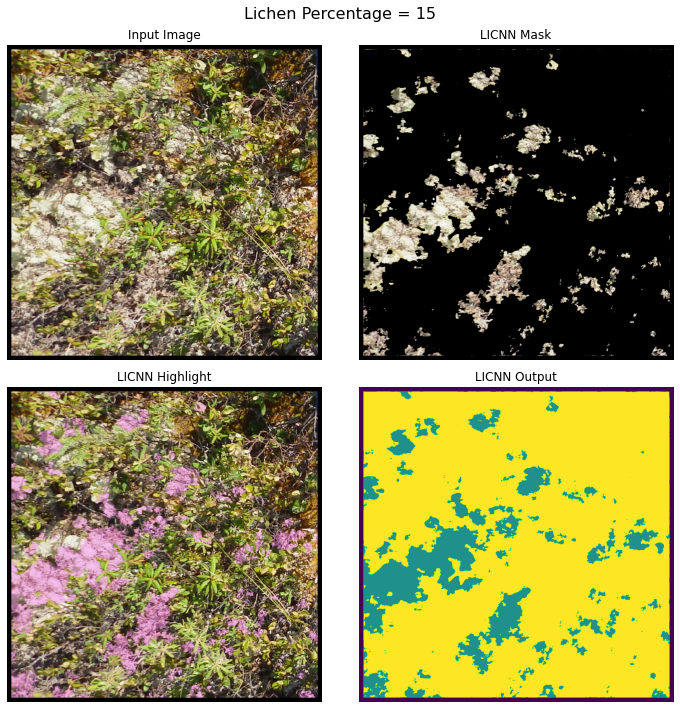


22 Photos to process
c6156_c_rtf.png
800x800 Resized image

Non border pixels = 602323
Lichen pixels = 528675
Lichen percentage = 85


<Figure size 432x288 with 0 Axes>

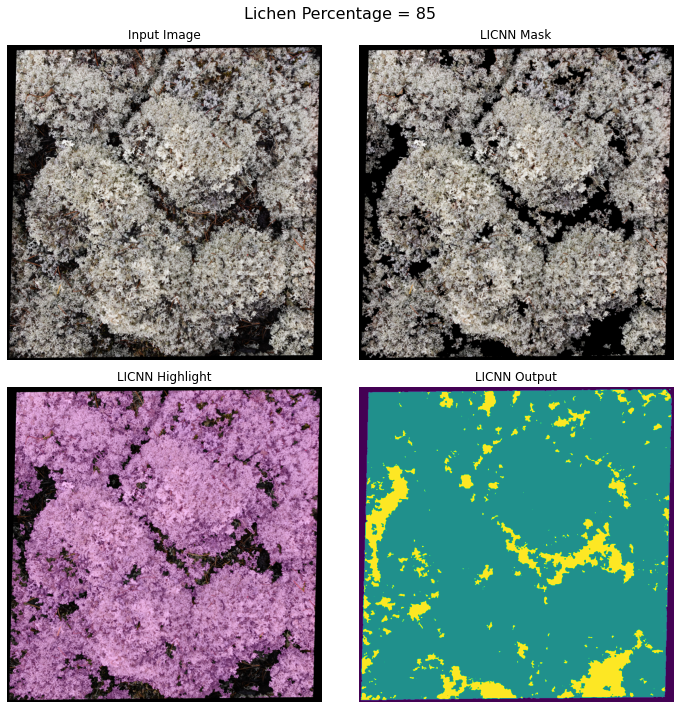


21 Photos to process
c6183_c_rtf.png
800x800 Resized image

Non border pixels = 609549
Lichen pixels = 312181
Lichen percentage = 50


<Figure size 432x288 with 0 Axes>

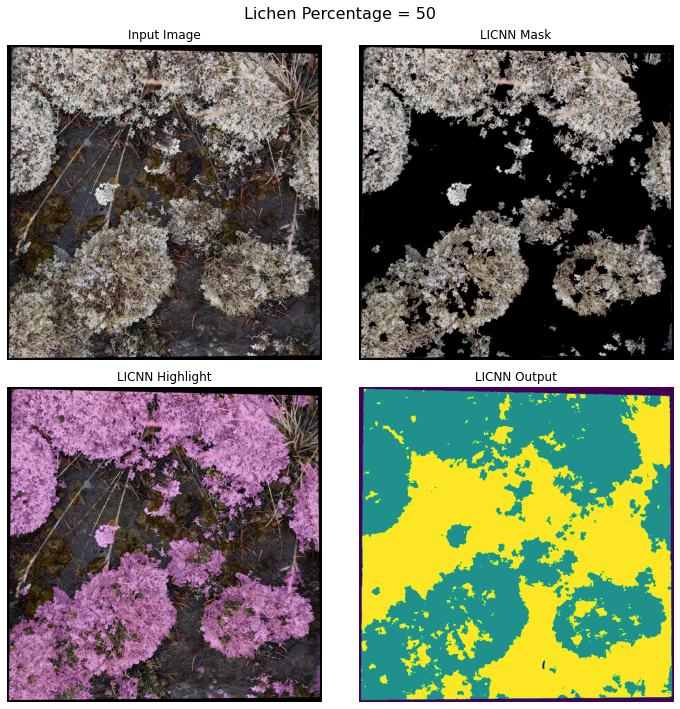


20 Photos to process
c6987_c_rtf.png
800x800 Resized image

Non border pixels = 607949
Lichen pixels = 66377
Lichen percentage = 10


<Figure size 432x288 with 0 Axes>

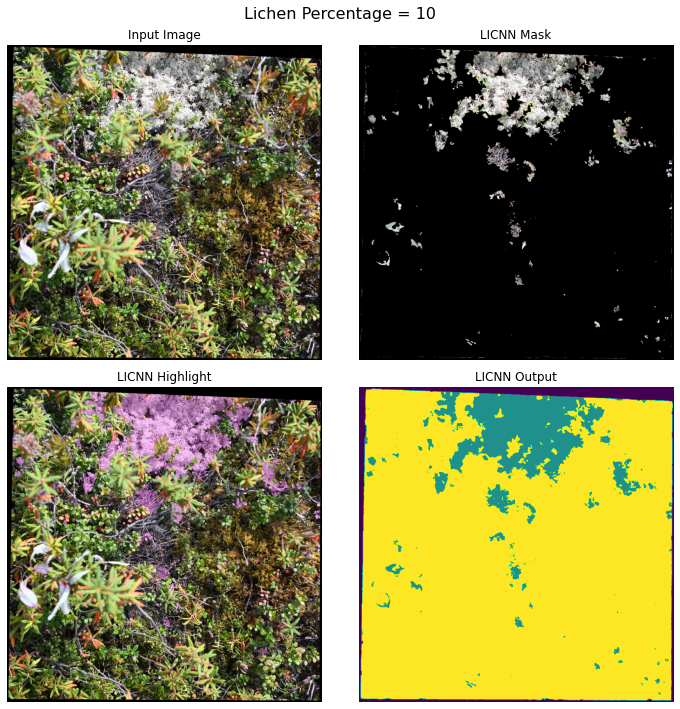


19 Photos to process
c6997_c_rtf.png
800x800 Resized image

Non border pixels = 581591
Lichen pixels = 43457
Lichen percentage = 5


<Figure size 432x288 with 0 Axes>

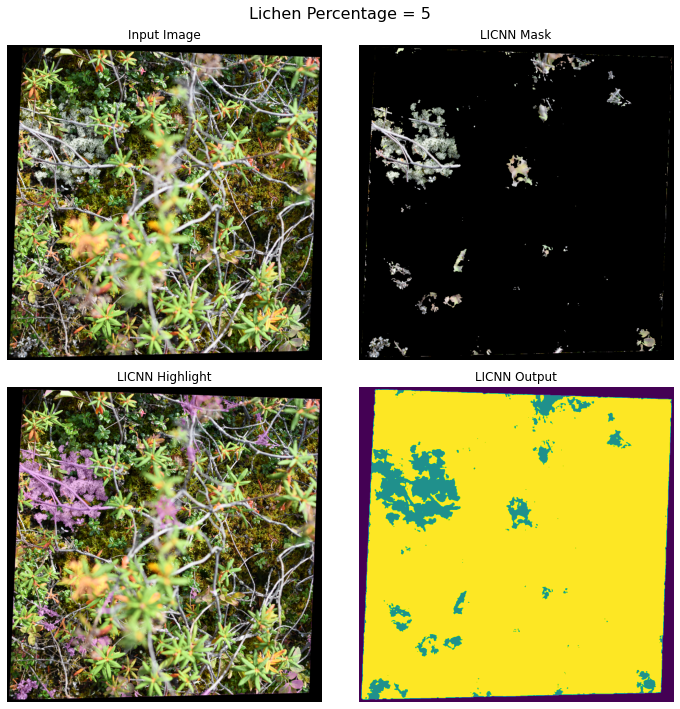


18 Photos to process
c8RIMG0570.png
800x800 Resized image

Non border pixels = 595984
Lichen pixels = 80955
Lichen percentage = 15


<Figure size 432x288 with 0 Axes>

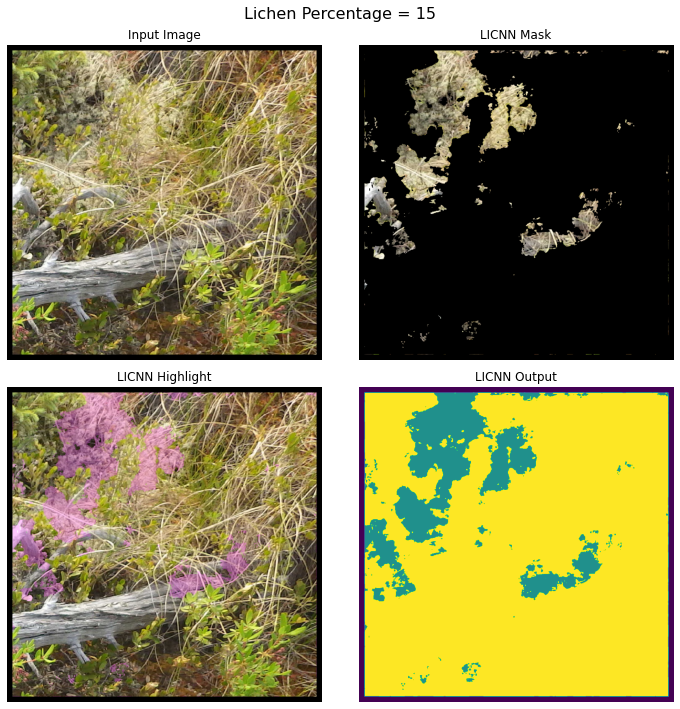


17 Photos to process
cRIMG0552.png
800x800 Resized image

Non border pixels = 598875
Lichen pixels = 95425
Lichen percentage = 15


<Figure size 432x288 with 0 Axes>

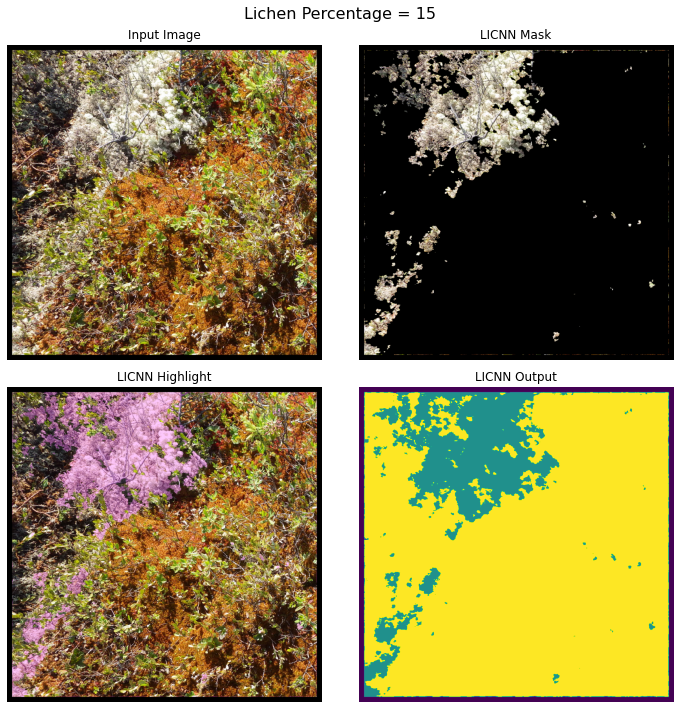


16 Photos to process
cRIMG0558.png
800x800 Resized image

Non border pixels = 596438
Lichen pixels = 125817
Lichen percentage = 20


<Figure size 432x288 with 0 Axes>

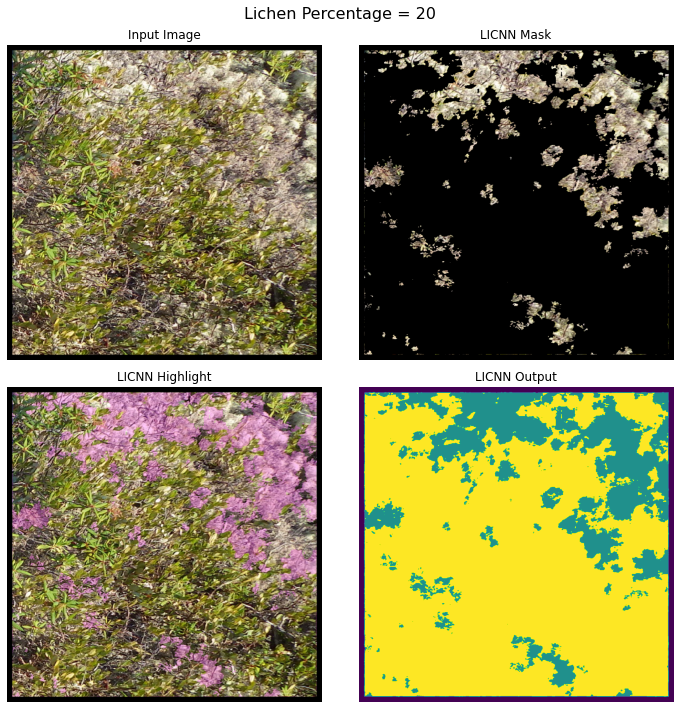


15 Photos to process
cRIMG0561.png
800x800 Resized image

Non border pixels = 608339
Lichen pixels = 97581
Lichen percentage = 15


<Figure size 432x288 with 0 Axes>

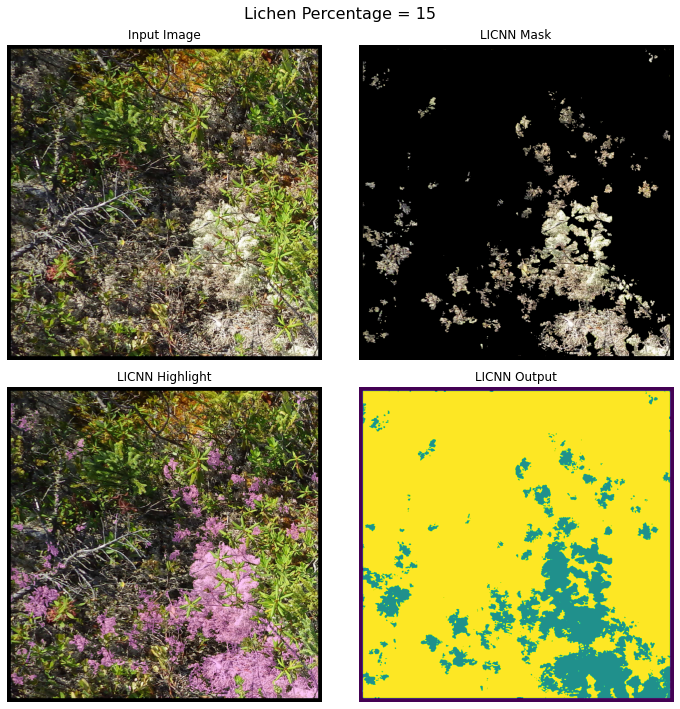


14 Photos to process
cRIMG0565.png
800x800 Resized image

Non border pixels = 595961
Lichen pixels = 93948
Lichen percentage = 15


<Figure size 432x288 with 0 Axes>

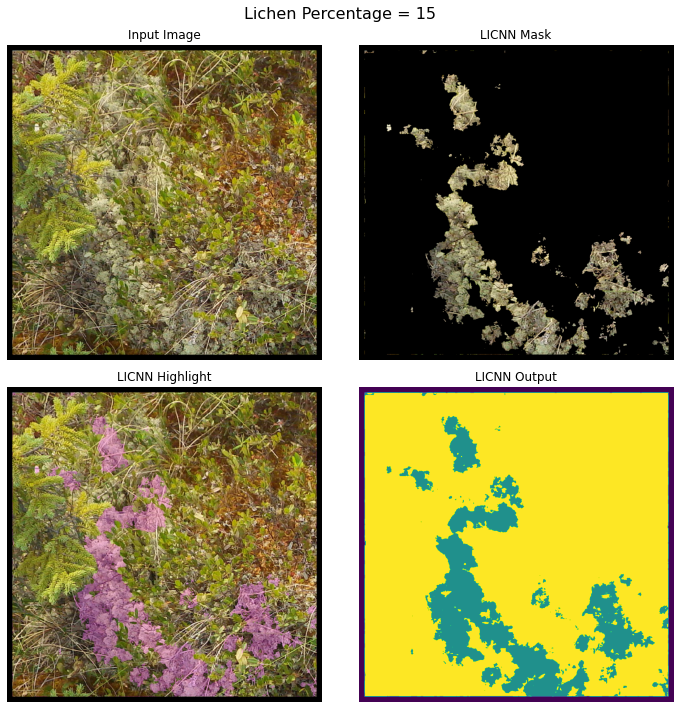


13 Photos to process
H1C_c_rtf.png
800x800 Resized image

Non border pixels = 597518
Lichen pixels = 303128
Lichen percentage = 50


<Figure size 432x288 with 0 Axes>

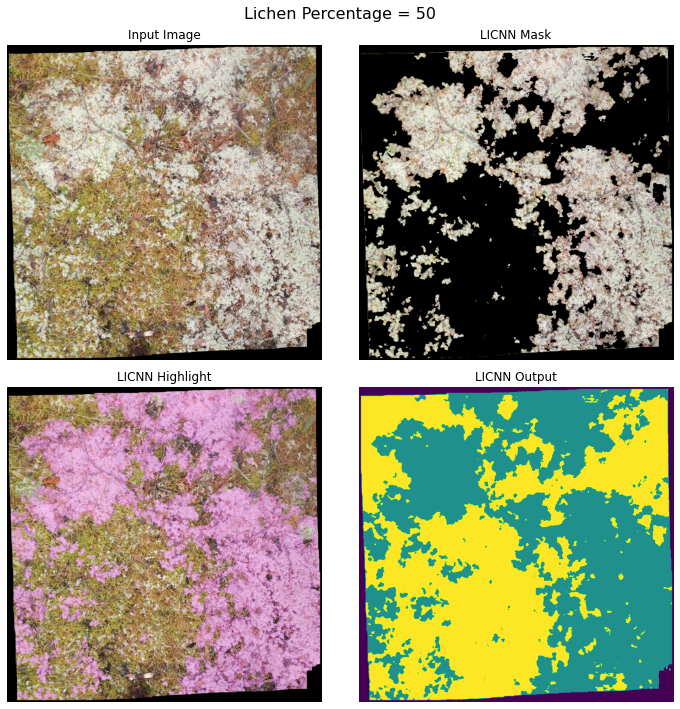


12 Photos to process
H2NE_c_rtf.png
800x800 Resized image

Non border pixels = 616995
Lichen pixels = 77260
Lichen percentage = 10


<Figure size 432x288 with 0 Axes>

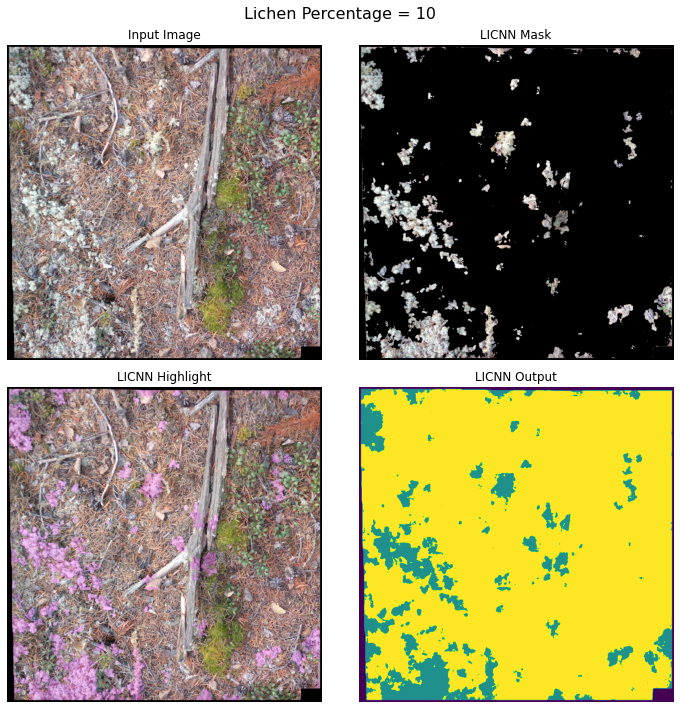


11 Photos to process
L1NW_c_rtf.png
800x800 Resized image

Non border pixels = 547882
Lichen pixels = 294520
Lichen percentage = 55


<Figure size 432x288 with 0 Axes>

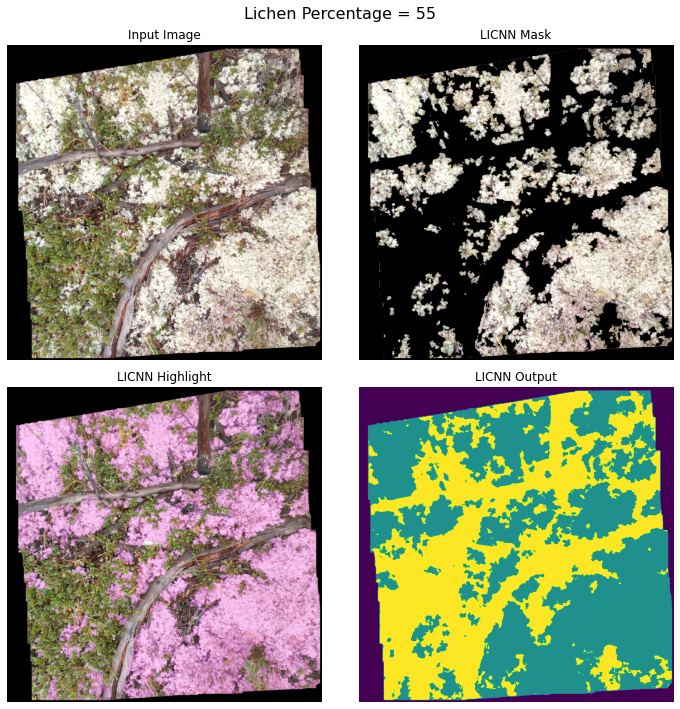


10 Photos to process
L3NW_c_rtf.png
800x800 Resized image

Non border pixels = 572145
Lichen pixels = 196092
Lichen percentage = 35


<Figure size 432x288 with 0 Axes>

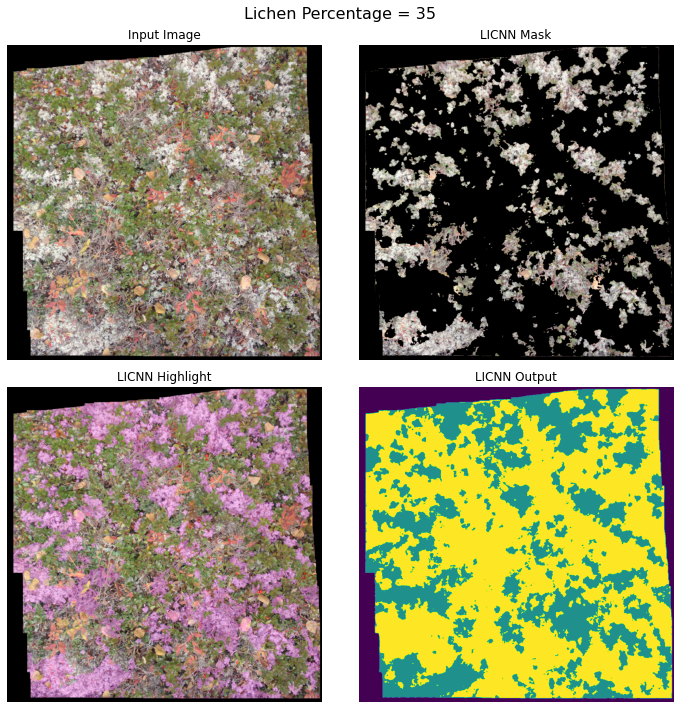


9 Photos to process
M1C_c_rtf.png
800x800 Resized image

Non border pixels = 580325
Lichen pixels = 417332
Lichen percentage = 70


<Figure size 432x288 with 0 Axes>

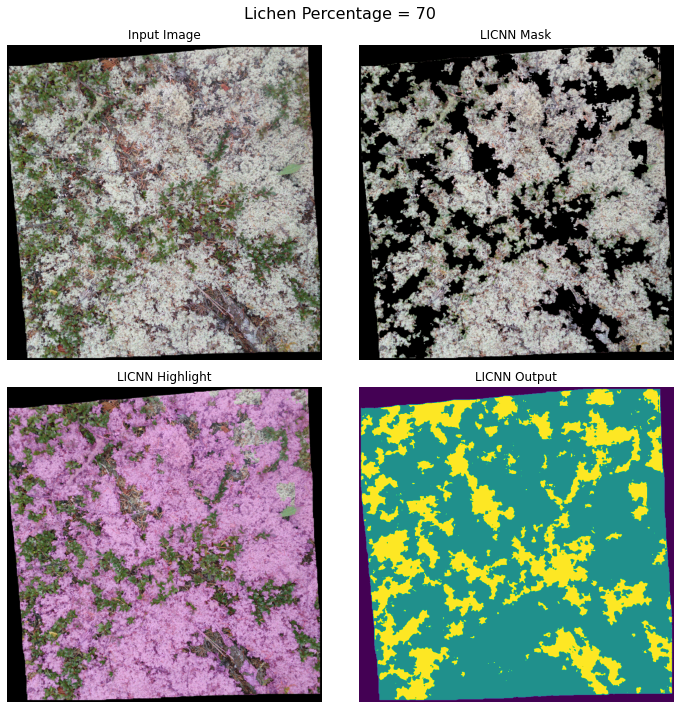


8 Photos to process
s10p9_c1_rtf.png
800x800 Resized image

Non border pixels = 608622
Lichen pixels = 481687
Lichen percentage = 80


<Figure size 432x288 with 0 Axes>

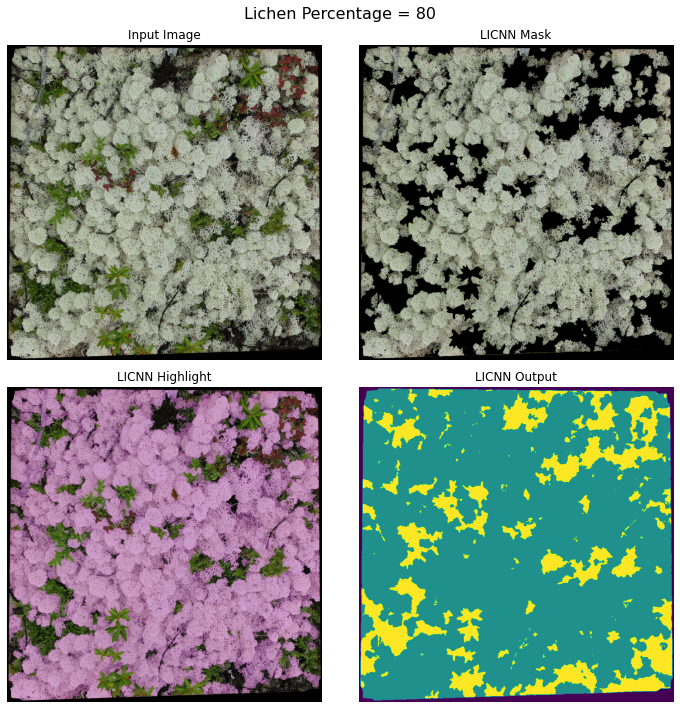


7 Photos to process
s1p5_clip1_rtf.png
800x800 Resized image

Non border pixels = 589368
Lichen pixels = 393803
Lichen percentage = 65


<Figure size 432x288 with 0 Axes>

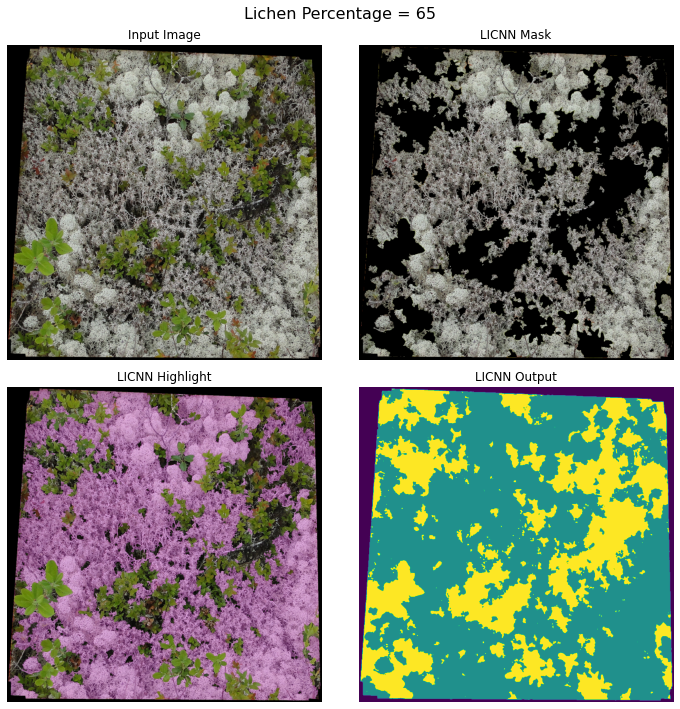


6 Photos to process
s4p1_clip1_rtf.png
800x800 Resized image

Non border pixels = 604821
Lichen pixels = 91725
Lichen percentage = 15


<Figure size 432x288 with 0 Axes>

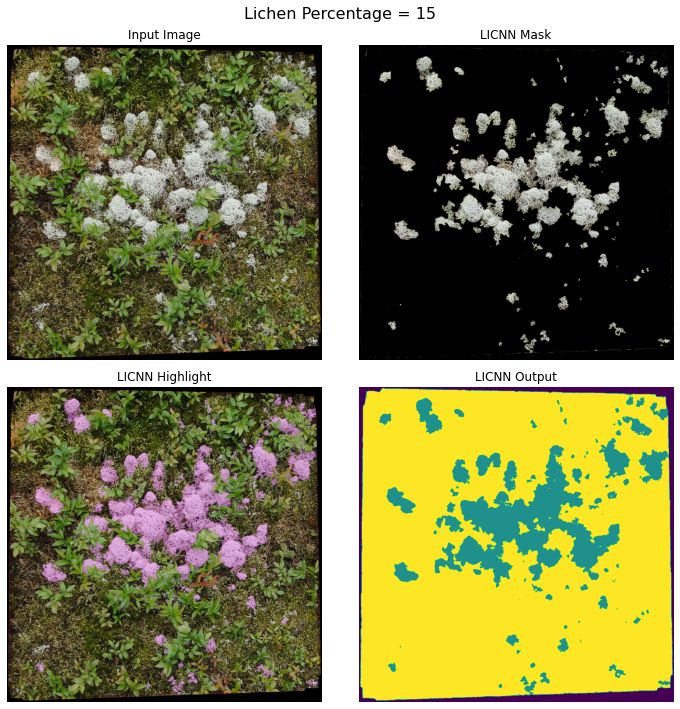


5 Photos to process
s4p9_clip1_rtf.png
800x800 Resized image

Non border pixels = 606165
Lichen pixels = 70141
Lichen percentage = 10


<Figure size 432x288 with 0 Axes>

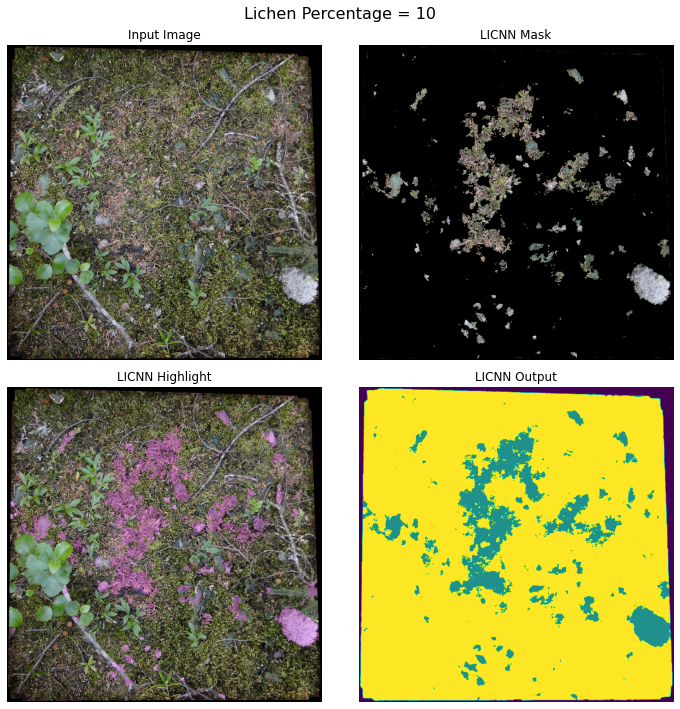


4 Photos to process
s5p4_clip1_rtf.png
800x800 Resized image

Non border pixels = 604289
Lichen pixels = 294505
Lichen percentage = 50


<Figure size 432x288 with 0 Axes>

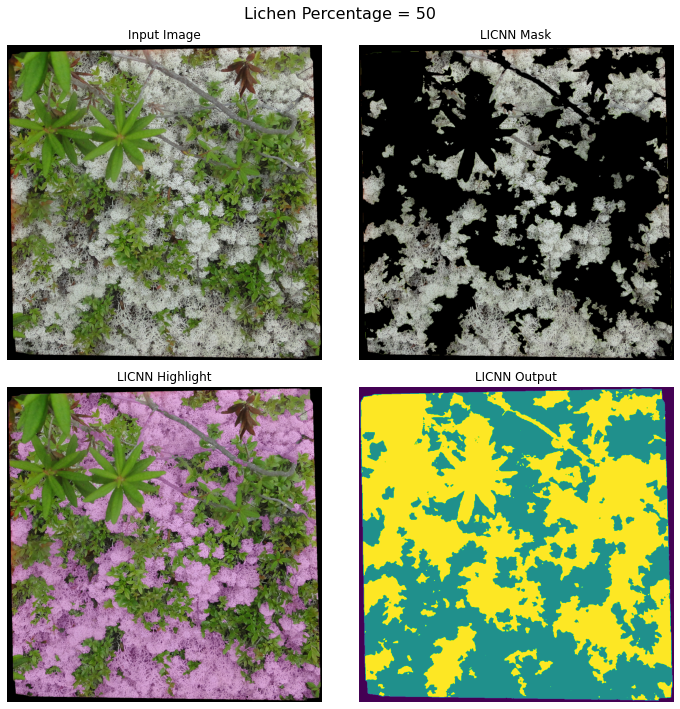


3 Photos to process
s6p1_clip1_rtf.png
800x800 Resized image

Non border pixels = 591780
Lichen pixels = 494772
Lichen percentage = 85


<Figure size 432x288 with 0 Axes>

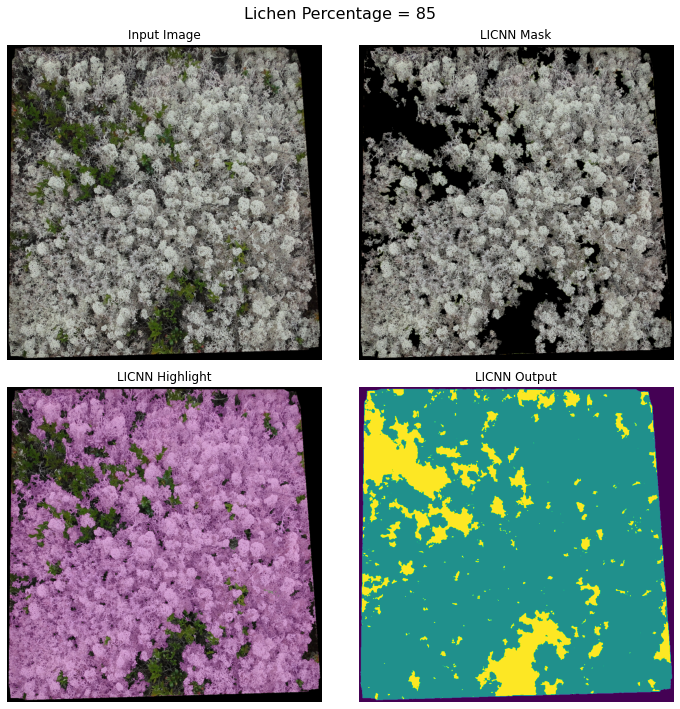


2 Photos to process
s7p4_clip1_rtf.png
800x800 Resized image

Non border pixels = 593341
Lichen pixels = 159498
Lichen percentage = 25


<Figure size 432x288 with 0 Axes>

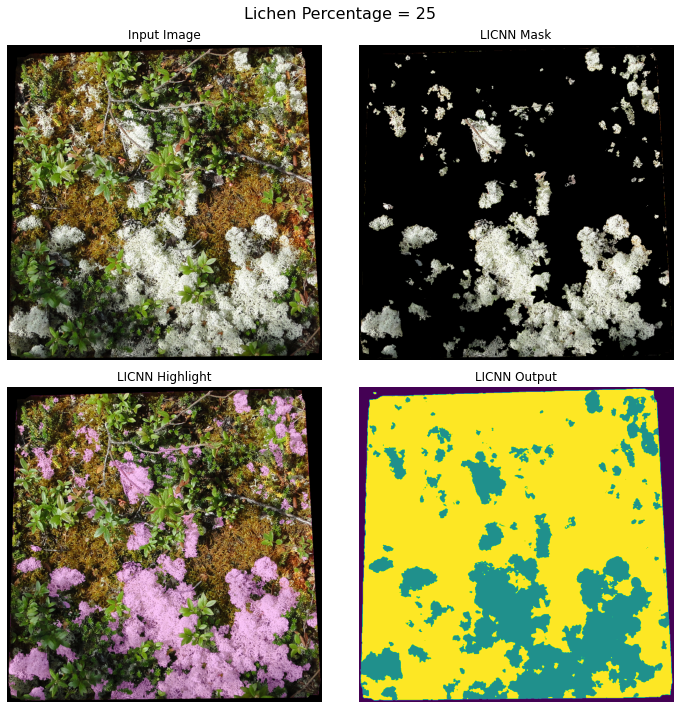


1 Photos to process
s9p1_rtf.png
800x800 Resized image

Non border pixels = 511884
Lichen pixels = 170413
Lichen percentage = 35


<Figure size 432x288 with 0 Axes>

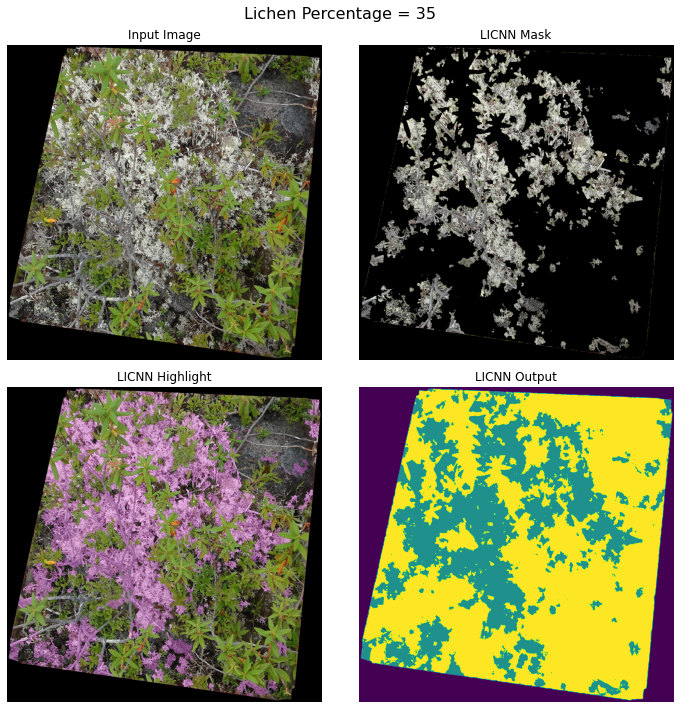

Completed Workflow of 23 photos in 38.36 seconds.


In [13]:
'''After activating this cell, the script will start working and you should see results below'''
run_workflow(input_photo_dir,output_dir)